In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pickle
import glob
from ipywidgets import interact, interactive, fixed
from moviepy.editor import VideoFileClip
from IPython.display import HTML
%matplotlib inline

# Camera Calibrations

[]

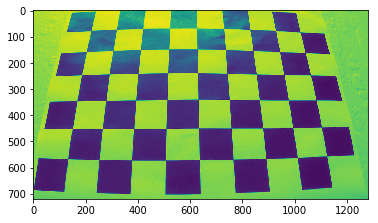

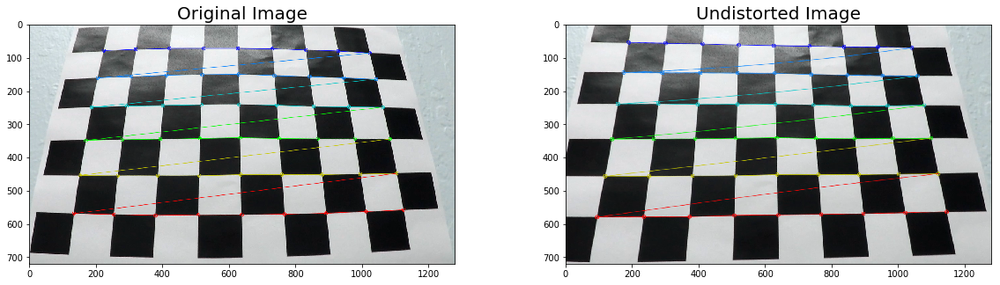

In [2]:
# call cv2 undistor
#def undistort(image, matrix, dis):
#    return cv2.undistort(image, matrix, dis, None, matrix)

nx = 9 # different than the course lecture
ny = 6
objpoints = []
imgpoints = []
# prepare object points, like (0,0,0), (1,0,0), ... 
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

img = cv2.imread('camera_cal/calibration3.jpg') # pick one
plt.imshow(img)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.imshow(gray)

#Finding chessboard corners (for an nx x ny board):
ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
# assume ret == True
imgpoints.append(corners)
objpoints.append(objp)
# Drawing detected corners on an image:
cv2.drawChessboardCorners(img, (nx, ny), corners, ret)

# Camera calibration, given object points, image points, and the shape of the grayscale image:
ret, matrix, dist, rvecs, tvecs = \
            cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
# where dist is distortion coefficent
# matrix, camera matrix to transform 3D to 2D image points

# Undistorting a test image:
undistorted = cv2.undistort(img, matrix, dist, None, matrix)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,5))                             
ax1.set_title('Original Image', fontsize=20)
ax2.set_title('Undistorted Image', fontsize=20)
ax1.imshow(img)
ax2.imshow(undistorted)
plt.plot()

mkdir: cannot create directory ‘undistorted_folder’: File exists


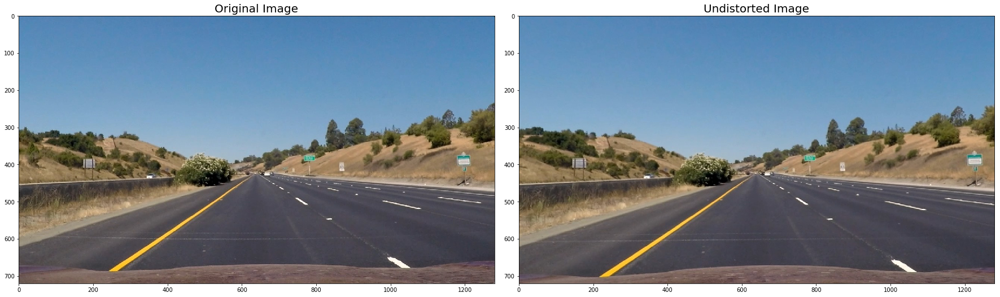

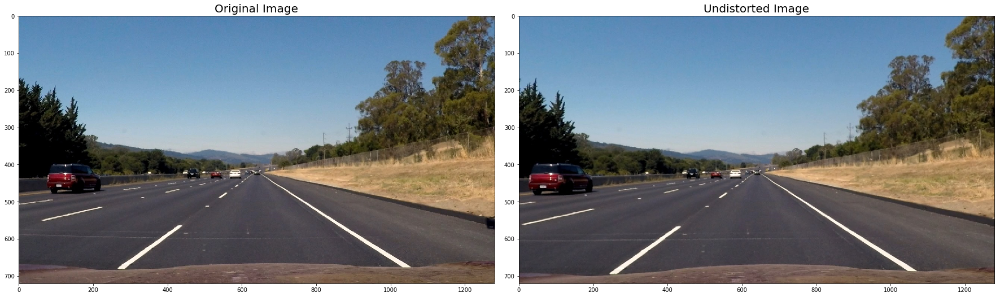

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


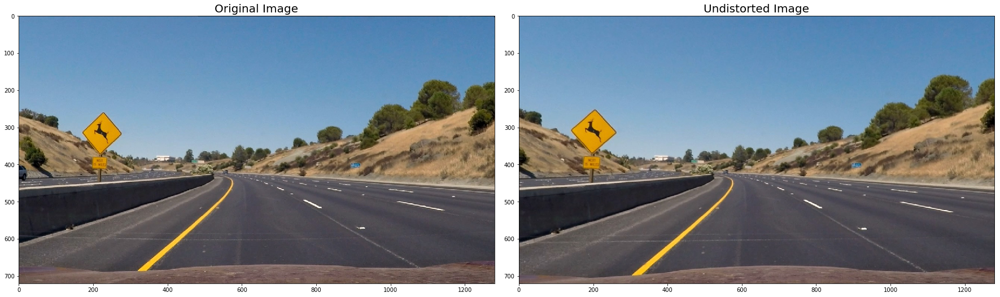

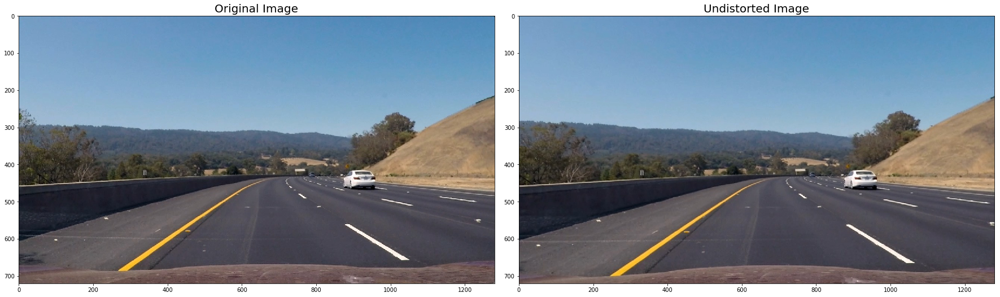

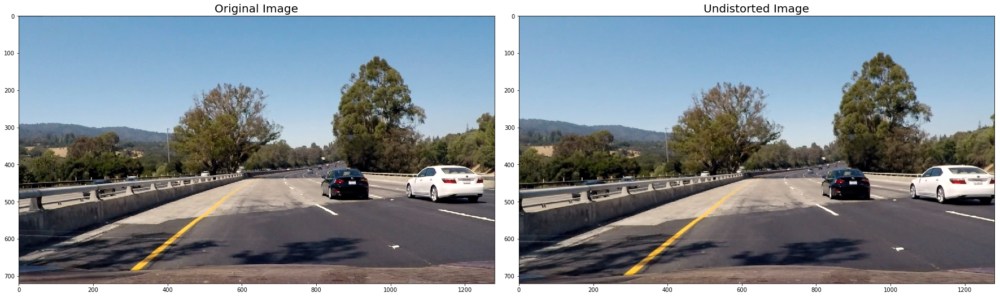

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


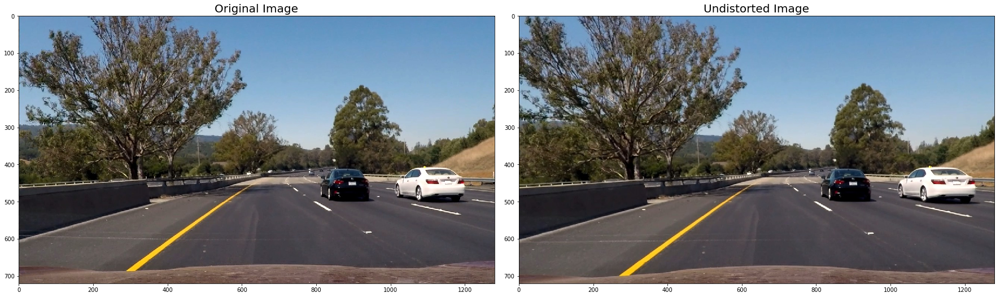

In [3]:
# mkdir system call
%mkdir undistorted_folder 

def save(dire, fname, img):
    #print(fname)
    fname = ''.join([dire,'undistorted_',fname])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    cv2.imwrite(fname,img)

images = ['straight_lines1.jpg', 'straight_lines2.jpg',
          'test1.jpg', 'test2.jpg','test3.jpg', 'test4.jpg', 'test5.jpg', 'test6.jpg']

for fname in images:
    img = cv2.imread('test_images/'+fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    undistorted = cv2.undistort(img, matrix, dist, None, matrix) #undistort(img, matrix, dist)          
    save('undistorted_folder/', fname, undistorted)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(undistorted)
    ax2.set_title('Undistorted Image', fontsize=20)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)        

In [4]:
# Code taken from Udacity lecture

# Sobel Absolute Threshold 
def abs_sobel_thresh(img, direction='x', 
                     sobel_kernel=3, thresh=(0, 255)):    
    img  = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    scaled_sobel = None
    # Sobel x
    if direction == 'x':
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
        abs_sobelx = np.absolute(sobelx) 
        scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))  
    # Sobel y
    else:
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel) 
        abs_sobely = np.absolute(sobely) 
        scaled_sobel = np.uint8(255*abs_sobely/np.max(abs_sobely))
        
    thresh_min = thresh[0]
    thresh_max = thresh[1]
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1    
    return sxbinary

In [5]:
# Sobel Magnitude Threshold 
def mag_thresh(img, sobel_kernel=3, 
               mag_thresh=(0, 255)):
    img =  cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel)
    magnitude = np.sqrt(np.square(sobelx)+np.square(sobely))
    abs_magnitude = np.absolute(magnitude)
    scaled_magnitude = np.uint8(255*abs_magnitude/np.max(abs_magnitude))
    mag_binary = np.zeros_like(scaled_magnitude)
    mag_binary[(scaled_magnitude >= mag_thresh[0]) & (scaled_magnitude <= mag_thresh[1])] = 1    
    return mag_binary

In [6]:
# Sobel Direction Threshold
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    arctan = np.arctan2(abs_sobely, abs_sobelx)
    dir_binary = np.zeros_like(arctan)
    dir_binary[(arctan >= thresh[0]) & (arctan <= thresh[1])] = 1    
    return dir_binary

In [7]:
def combined_sobel_gradient_thres(img, disp=False, s_thresh_min=150, s_thresh_max=255):    
    ksize = 3     # Sobel kernel size
    gradx = abs_sobel_thresh(img, direction='x', sobel_kernel=ksize, thresh=(20, 100))
    grady = abs_sobel_thresh(img, direction='y', sobel_kernel=ksize, thresh=(20, 100))
    mag_binary = mag_thresh(img, sobel_kernel=ksize, mag_thresh=(20, 100))
    dir_binary = dir_threshold(img, sobel_kernel=ksize, thresh=(0.7, 1.4))    
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1))|((mag_binary == 1) & (dir_binary == 1))] = 1    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]    
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1    
    combined_binary = np.zeros_like(combined)    
    combined_binary[(s_binary == 1) | (combined == 1)] = 1  
    fs = 30 # font size
    if disp == True:
        f, (ax1, ax2) = plt.subplots(2, 2, figsize=(40,20))
        ax1[0].set_title('Original Image', fontsize=20)
        ax1[0].imshow(img)
        ax1[1].set_title('Combined gradx, grady, mag, dir', fontsize=fs)
        ax1[1].imshow(combined, cmap='gray')
        ax2[0].set_title('Color Thresholding', fontsize=fs)
        ax2[0].imshow(s_binary, cmap='gray')
        ax2[1].set_title('Combined S Binary', fontsize=fs)
        ax2[1].imshow(combined_binary, cmap='gray')        
    return combined_binary, img, combined, s_binary

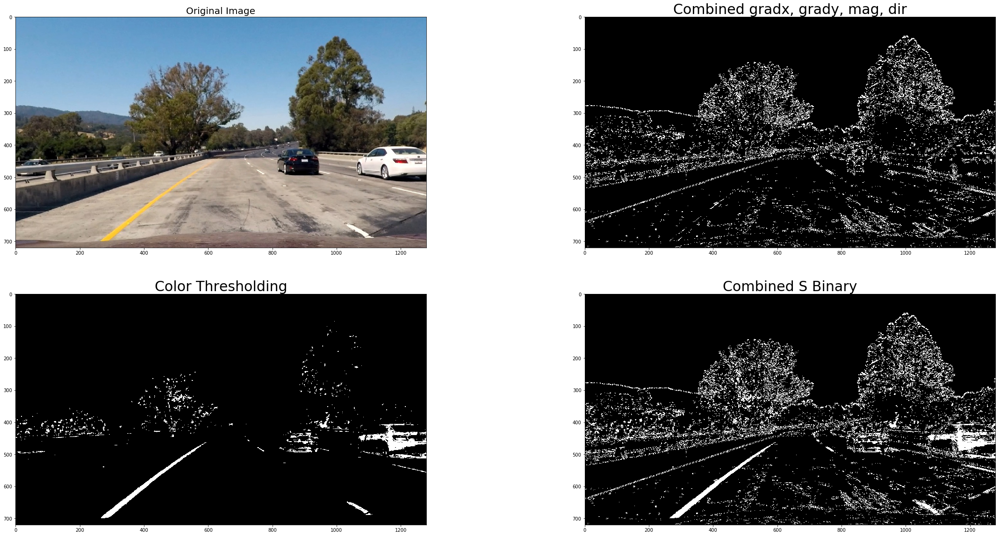

In [8]:
# check the plots
"""
img = 'undistorted_folder/undistorted_test6.jpg'
img = cv2.imread(img)
combined_binary, _, _, _ = combined_sobel_gradient_thres(img, disp=True)
img = 'undistorted_folder/undistorted_test2.jpg'
img = cv2.imread(img)
combined_binary, _, _, _ = combined_sobel_gradient_thres(img, disp=True)
img = 'undistorted_folder/undistorted_test5.jpg'
img = cv2.imread(img)
combined_binary, _, _, _ = combined_sobel_gradient_thres(img, disp=True)
"""
#img = 'undistorted_folder/undistorted_straight_lines1.jpg'
img = 'undistorted_folder/undistorted_test1.jpg'
img = cv2.imread(img)
combined_binary, img_color, combined_1, s_binary = combined_sobel_gradient_thres(img, disp=True)

In [9]:
def transform_image_warp(img, nx, ny): 
    offset = 100 # offset for dst points
    #type(img)
    # Grab the image shape
    img_size = (img.shape[1], img.shape[0])    
    #print(imgsz)
    src = np.float32(
        [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
        [((img_size[0] / 6) - 10), img_size[1]],
        [(img_size[0] * 5 / 6) + 60, img_size[1]],
        [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
    dst = np.float32(
        [[(img_size[0] / 4), 0],
        [(img_size[0] / 4), img_size[1]],
        [(img_size[0] * 3 / 4), img_size[1]],
        [(img_size[0] * 3 / 4), 0]])
    """
    lu = [570, 450]
    ru = [700, 450]
    ll = [160, 680]
    rl = [1150, 680]
    """
    #src = np.float32([lu, ll, ru, rl])
    """
    leftupperpoint  = [568,470]
    rightupperpoint = [717,470]
    leftlowerpoint  = [260,680]
    rightlowerpoint = [1043,680]
    """
    #print(src)
    #print(dst)
    #src = np.float32([leftupperpoint, leftlowerpoint, rightupperpoint, rightlowerpoint])
    #dst = np.float32([[450,680], [450,0], [750,680], [750,0]])    
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_NEAREST)    
    return warped, M


def display_transformed_image(combined_binary, warped_img):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(combined_binary, cmap='gray')
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(warped_img,cmap='gray')
    ax2.set_title('Warped Image', fontsize=30)    
    plt.show()

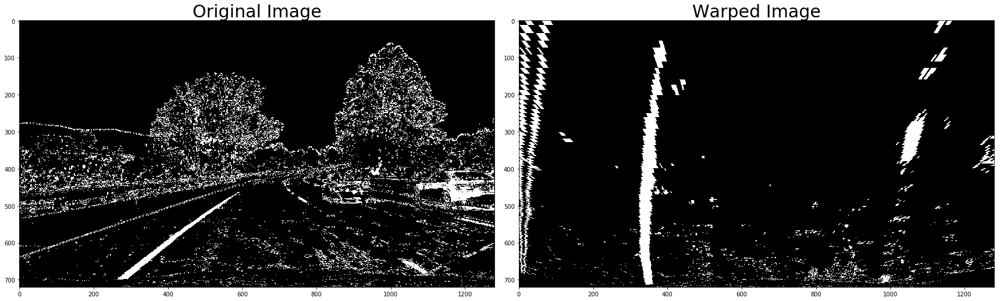

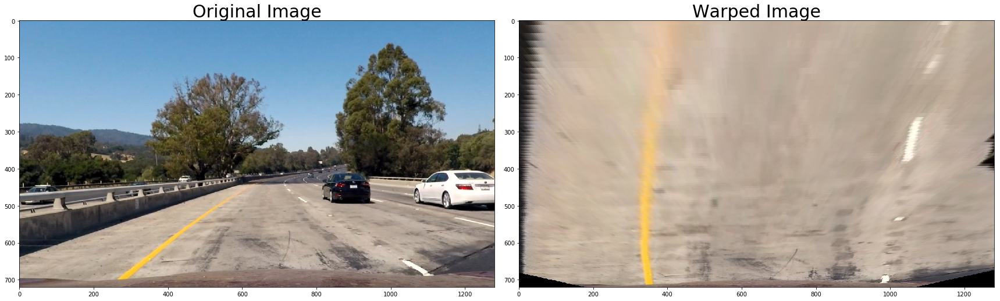

"\nimg1 = 'undistorted_folder/undistorted_test5.jpg'\nimg1 = cv2.imread(img1)\ncombined_binary_1, _, _, _ = combined_sobel_gradient_thres(img1, disp=False)\nwarped_img_1, M_1 = transform_image_warp(combined_binary_1, nx, ny) \ndisplay_transformed_image(combined_binary_1, warped_img_1)\n"

In [10]:
#warped, M = transform_image(combined_binary, src, dst, matrix) 
warped_img, M = transform_image_warp(combined_binary, nx, ny) 
display_transformed_image(combined_binary, warped_img)

color_warped_img, color_M = transform_image_warp(img_color, nx, ny) 
display_transformed_image(img_color, color_warped_img)

"""
img1 = 'undistorted_folder/undistorted_test5.jpg'
img1 = cv2.imread(img1)
combined_binary_1, _, _, _ = combined_sobel_gradient_thres(img1, disp=False)
warped_img_1, M_1 = transform_image_warp(combined_binary_1, nx, ny) 
display_transformed_image(combined_binary_1, warped_img_1)
"""

In [11]:
# Locating the Lanes
def locating_lanes(binary_warped, nwindows=9, margin=100, minpix=50):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []    
    ## Create an image to draw on and an image to show the selection window
    ##out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
     
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    return left_fit, right_fit,left_lane_inds, right_lane_inds, nonzerox, nonzeroy, histogram


In [12]:
def display_lanes(left_fit, right_fit, left_lane_inds, 
                  right_lane_inds, binary_warped, 
                  nonzerox, nonzeroy, histogram, margin=50):
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [100, 200, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]),  (0, 255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0, 255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    plt.imshow(binary_warped)
    #plt.imshow(out_img)
    #plt.imshow(result)
    plt.plot(left_fitx, ploty, color='red')
    plt.plot(right_fitx, ploty, color='red')    
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.show()

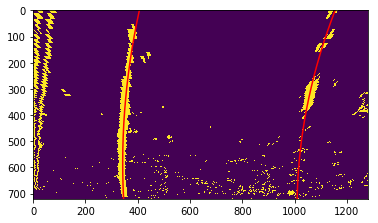

In [13]:
left_fit, right_fit, left_lane_inds, right_lane_inds,\
            nonzerox, nonzeroy, histogram = locating_lanes(warped_img)
    
display_lanes(left_fit, right_fit, left_lane_inds, \
              right_lane_inds, warped_img, nonzerox, nonzeroy, histogram)

......


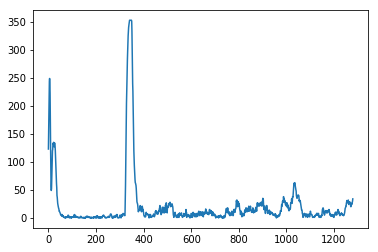

In [14]:
print('......')
plt.plot(histogram)  
plt.show()


# Radius of Curvature & Distance from Lane Center

In [18]:
def radius_curvature_center(binary_img, left_fit, right_fit):        
    ym_per_pix = 30/720 #3.048/100  # meters per pixel in y dimension
    xm_per_pix = 3.7/700 #3.7/380 #3.7/700 # meters per pixel in x dimension
    h = binary_img.shape[0] 
    ploty = np.linspace(0, h-1, h)
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    y_eval = np.max(ploty)    
    # follow udacity lecture formulat
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)    
    left_curv  = ((1 + (2*left_fit_cr[0] *y_eval*ym_per_pix \
                        + left_fit_cr[1])**2) **1.5) / np.absolute(2*left_fit_cr[0])
    
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)        
    right_curv = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix \
                        + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    # Calculate vehicle center
    #left_lane and right lane bottom in pixels
    left_lane_bottom = (left_fit[0]*y_eval)**2 + left_fit[0]*y_eval + left_fit[2]
    right_lane_bottom = (right_fit[0]*y_eval)**2 + right_fit[0]*y_eval + right_fit[2]
    
    # Lane center as mid of left and right lane bottom                        
    lane_center = (left_lane_bottom + right_lane_bottom)/2.
    center_image = binary_img.shape[1]/2 #640
    center_dist = (lane_center - center_image) * xm_per_pix #Convert to meters
    #position = "left" if center_dist < 0 else "right"
    #center_dist = "vehicle is {:.4f}m {}".format(center_dist, position)
    return left_curv, right_curv, center_dist

In [19]:
left_curv, right_curv, center = radius_curvature_center(warped_img, left_fit, right_fit)


In [20]:
def draw_on_image(undist, warped_img, left_fit, right_fit, M, \
               left_curv, right_curv, center, show_values = False):
    
    ploty = np.linspace(0, warped_img.shape[0]-1, warped_img.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    M_inverse = np.linalg.inv(M)
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, M_inverse, \
                                  (undist.shape[1], img.shape[0])) 
        
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    cv2.putText(result, 'left curvature: {:.2f} m'.format(left_curv), \
                (50, 50), cv2.FONT_HERSHEY_DUPLEX, 1, (255, 255, 255), 2)
    
    cv2.putText(result, 'right curvature: {:.2f} m'.format(right_curv), \
                (50, 100), cv2.FONT_HERSHEY_DUPLEX, 1, (255, 255, 255), 2)
    
    lr = ''
    if(center > 0): lr = 'right'
    elif (center<0): lr = 'left'
    else: lr = 'center'
    
    cv2.putText(result, 'vehicle is {:.2f}m {}'.format(abs(center), lr), \
                (50, 150), cv2.FONT_HERSHEY_DUPLEX, 1, (255, 255, 255), 2)
    if show_values == True:
        fig, ax = plt.subplots(figsize=(15, 8))
        ax.imshow(result)        
    return result

array([[[ 95, 153, 199],
        [ 95, 153, 199],
        [ 95, 153, 199],
        ..., 
        [ 87, 148, 195],
        [ 87, 148, 195],
        [ 89, 147, 195]],

       [[ 96, 154, 200],
        [ 96, 154, 200],
        [ 96, 154, 200],
        ..., 
        [ 87, 148, 195],
        [ 87, 148, 195],
        [ 89, 147, 195]],

       [[ 95, 153, 199],
        [ 96, 154, 200],
        [ 96, 154, 200],
        ..., 
        [ 87, 148, 195],
        [ 87, 148, 195],
        [ 87, 148, 195]],

       ..., 
       [[117,  93,  91],
        [118,  94,  92],
        [118,  94,  92],
        ..., 
        [120, 101,  97],
        [121, 102,  98],
        [121, 102,  98]],

       [[122,  98,  96],
        [122,  98,  96],
        [121,  97,  95],
        ..., 
        [119, 100,  96],
        [120, 101,  97],
        [120, 101,  97]],

       [[125, 101,  99],
        [125, 101,  99],
        [124, 100,  98],
        ..., 
        [122, 103,  99],
        [123, 104, 100],
        [121, 102,

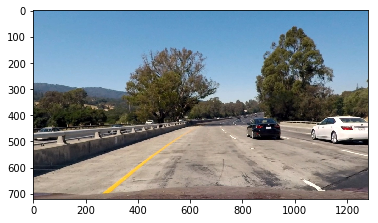

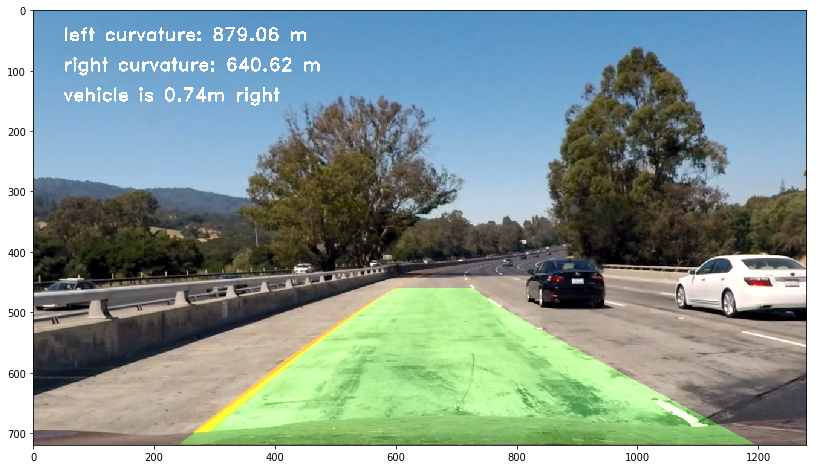

In [21]:
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
draw_on_image(img, warped_img, left_fit, right_fit, M, left_curv, right_curv, center, True)

# Pipeline

In [22]:
# for pipeline based on time-series images from the video
def locating_lanes_with_prev(left_fit, right_fit, binary_warped):    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 80
    
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) 
                    & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) 
                    & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fit_ = []
    right_fit_ = []
    # Fit a second order polynomial to each
    if len(leftx) != 0:        
        left_fit_ = np.polyfit(lefty, leftx, 2)
    
    if len(rightx) != 0:        
        right_fit_ = np.polyfit(righty, rightx, 2)
     
    return left_fit_, right_fit_

def is_good_lanes(left_fit, right_fit):    
    #Check if left and right fit returned a value
    if len(left_fit) ==0 or len(right_fit) == 0:
        status = False
    else:
        #Check distance b/w lines
        ploty = np.linspace(0, 20, num=10 )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        delta_lines = np.mean(right_fitx - left_fitx)
        if delta_lines >= 150 and delta_lines <=430: 
            status = True
        else:
            status = False
        
        # Calculate slope of left and right lanes at midpoint of y (i.e. 360)
        left = 2*left_fit[0]*360+left_fit[1]
        right = 2*right_fit[0]*360+right_fit[1]
        delta_slope_mid =  np.abs(left-right)
        
        #Check if lines are parallel at the middle
        if delta_slope_mid <= 0.1:
            status = True
        else:
            status = False
            
    return status 

In [23]:
# create a global data structure to store the time-series images
class Laneline():
    def __init__(self):
        self.last_left = None
        self.last_right = None
        self.left_fit = None
        self.right_fit = None
        self.count = 0
        self.reset_counter = 0
        self.histograms = None
        

In [24]:
lane = Laneline()

def find_lanes(img):    
    img = cv2.undistort(img, matrix, dist, None, matrix)
    combined_binary, _, _, _ = combined_sobel_gradient_thres(img)
    warped_img, M = transform_image_warp(combined_binary, nx, ny) 
    #print('lane counter --> ', lane.counter)
    if lane.count == 0:
        lane.left_fit, lane.right_fit, left_lane_inds,\
                right_lane_inds, nonzerox, nonzeroy, lane.histograms = locating_lanes(warped_img)
    else:
        lane.left_fit, lane.right_fit  = \
                locating_lanes_with_prev(lane.left_fit, lane.right_fit, warped_img)
    #return warped_img, lane.left_fit, lane.right_fit, M                
    #print(len(lane.left_fit), len(lane.right_fit))           
    return warped_img, lane.left_fit, lane.right_fit, M
    status = is_good_lanes(lane.left_fit, lane.right_fit)
    #print(status)
    if status == True:        
        lane.last_left, lane.last_right = lane.left_fit, lane.right_fit        
        lane.count += 1
        lane.reset_counter = 0
    else:   
        #Reset
        if lane.reset_counter > 4:
            lane.left_fit, lane.right_fit,left_lane_inds, \
                    right_lane_inds, nonzerox, nonzeroy, lane.histograms = locating_lanes(warped_img)
            lane.reset_counter = 0
        else:
            lane.left_fit, lane.right_fit = lane.last_left, lane.last_right
            
        lane.reset_counter += 1
    
    return warped_img, lane.left_fit, lane.right_fit, M

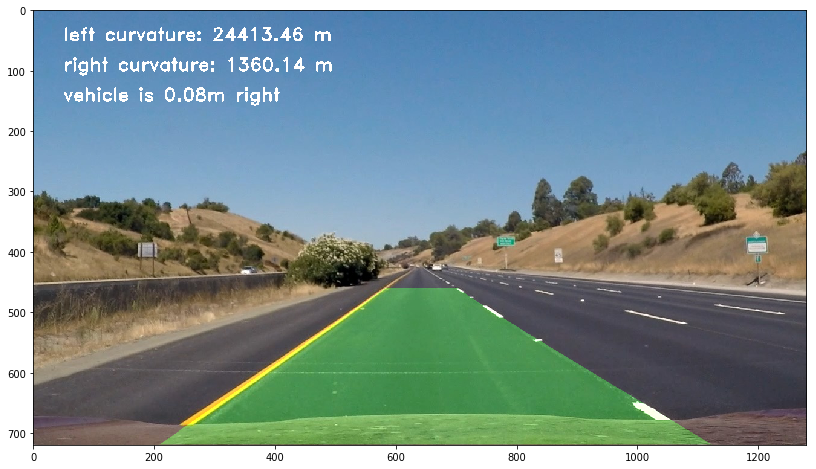

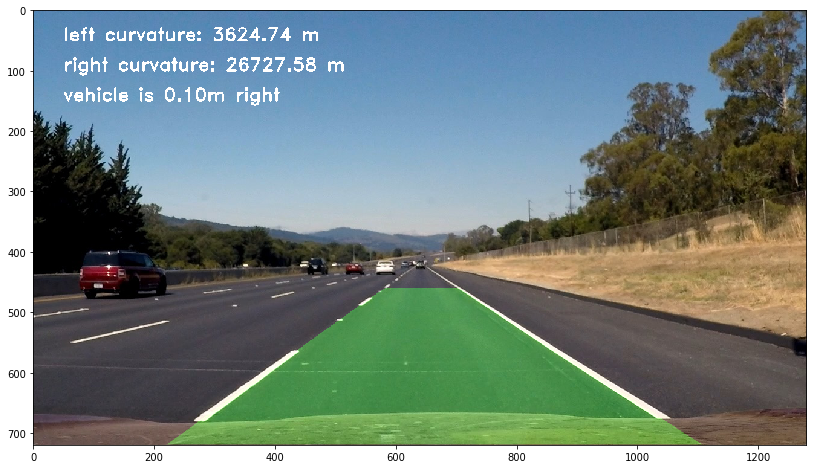

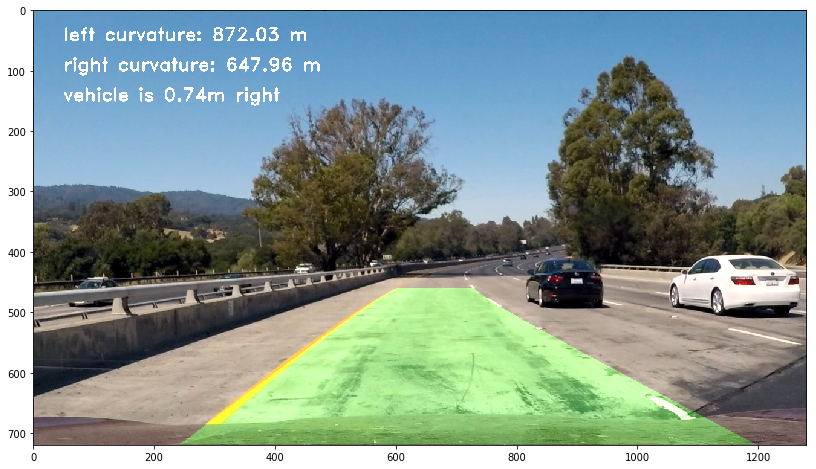

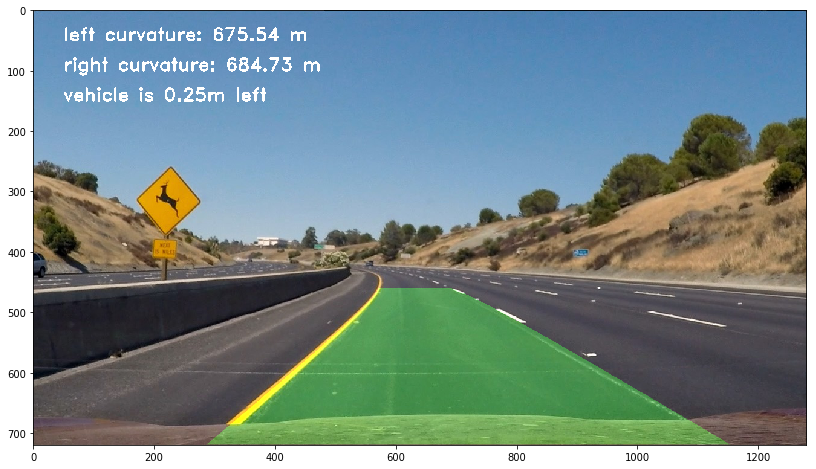

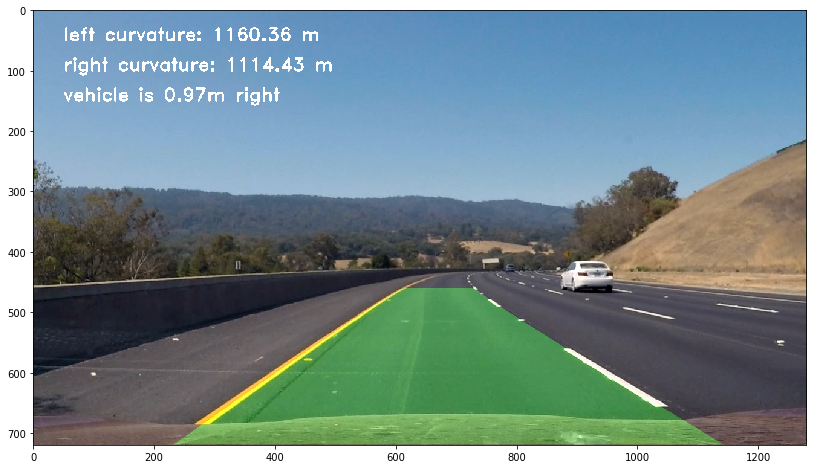

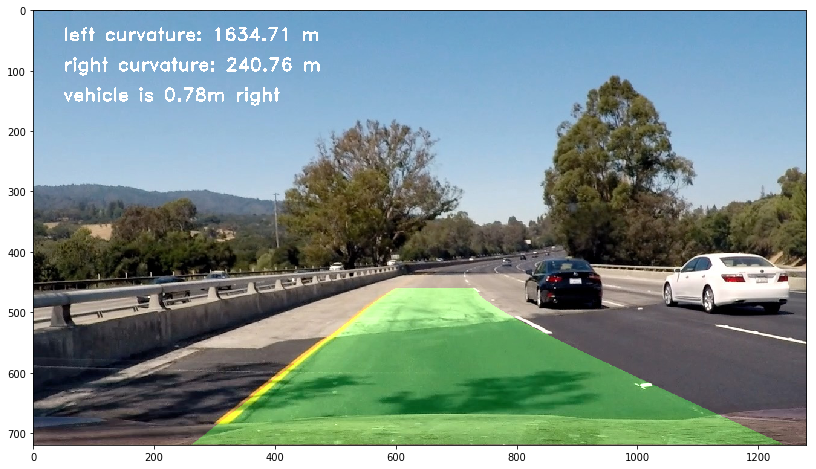

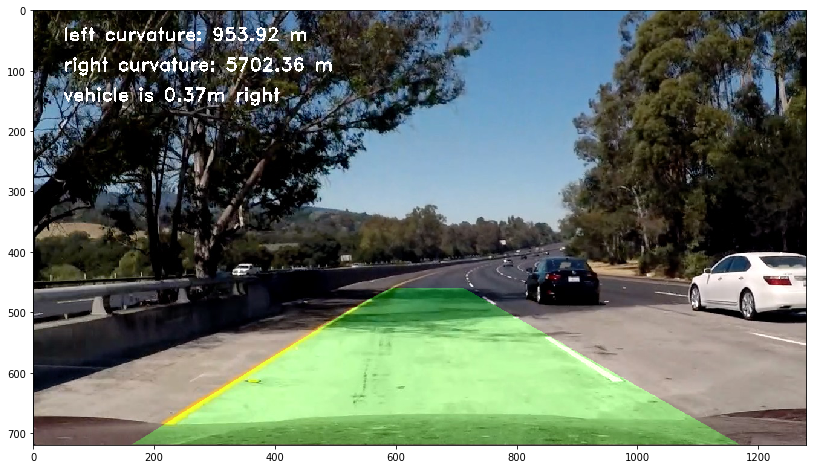

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [25]:
def pipeline(img, show_values=False):
    warped_img, left_fit, right_fit, M = find_lanes(img)    
    left_curvature, right_curvature, center = \
            radius_curvature_center(warped_img, left_fit, right_fit)
    return draw_on_image(img, warped_img, left_fit,\
                         right_fit, M, left_curvature, right_curvature, center, show_values)
    
images = ['straight_lines1.jpg', 'straight_lines2.jpg',\
          'test1.jpg', 'test2.jpg','test3.jpg', 'test4.jpg', \
          'test5.jpg', 'test6.jpg']

for fname in images:
    img = cv2.imread('test_images/'+fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    pipeline(img, True)

# Video Generations

In [26]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML 
lane = Laneline()
def process_video(img):
    return pipeline(img)

%mkdir videos

mkdir: cannot create directory ‘videos’: File exists


In [27]:
output_file = 'videos/project_video_output.mp4'
clip = VideoFileClip("project_video.mp4")
project_video_output = clip.fl_image(process_video)

%time project_video_output.write_videofile(output_file, audio=False)

[MoviePy] >>>> Building video videos/project_video_output.mp4
[MoviePy] Writing video videos/project_video_output.mp4


100%|█████████▉| 1260/1261 [04:59<00:00,  4.25it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: videos/project_video_output.mp4 

CPU times: user 11min 12s, sys: 4min 6s, total: 15min 19s
Wall time: 5min


In [28]:
HTML("""<video width="900" height="400" controls><source src="{0}"></video>""".format(output_file))